## Gatys Neural Style Transfer

The Neural-Style algorithm was developed by Leon A. Gatys, Alexander S. Ecker and Matthias Bethge. Neural-Style, or Neural-Transfer, allows you to take an image and reproduce it with a new artistic style. The algorithm takes three images, an input image, a content-image, and a style-image, and changes the input to resemble the content of the content-image and the artistic style of the style-image.

Paper: A Neural Algorithm of Artistic Style (https://arxiv.org/pdf/1508.06576.pdf)


In [19]:

from __future__ import print_function

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

from PIL import Image
import matplotlib.pyplot as plt

import torchvision.transforms as transforms
import torchvision.models as models

import copy


In [20]:

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# desired size of the output image
imsize = 512 if torch.cuda.is_available() else 128       # use small size if no gpu


In [21]:

loader = transforms.Compose([
    transforms.Resize(imsize),  # scale imported image
    transforms.ToTensor()])     # transform it into a torch tensor


unloader = transforms.ToPILImage()  # reconvert into PIL image

cnn_normalization_mean = torch.tensor([0.485, 0.456, 0.406]).to(device)
cnn_normalization_std  = torch.tensor([0.229, 0.224, 0.225]).to(device)


# desired depth layers to compute style/content losses :
content_layers_default = ['conv_4']
style_layers_default   = ['conv_1', 'conv_2', 'conv_3', 'conv_4', 'conv_5']


In [22]:


def image_loader(image_name):
    image = Image.open(image_name)
    # fake batch dimension required to fit network's input dimensions
    image = loader(image).unsqueeze(0)
    return image.to(device, torch.float)



In [23]:

def imshow(tensor, title=None):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    plt.imshow(image)
    if title is not None:
        plt.title(title)
    plt.pause(0.001) # pause a bit so that plots are updated



In [38]:
def to_save_as_PIL(tensor):
    image = tensor.cpu().clone()  # we clone the tensor to not do changes on it
    image = image.squeeze(0)      # remove the fake batch dimension
    image = unloader(image)
    return image

In [24]:

class ContentLoss(nn.Module):

    def __init__(self, target,):
        super(ContentLoss, self).__init__()
        # we 'detach' the target content from the tree used
        # to dynamically compute the gradient: this is a stated value,
        # not a variable. Otherwise the forward method of the criterion
        # will throw an error.
        self.target = target.detach()

    def forward(self, input):
        self.loss = F.mse_loss(input, self.target)
        return input


In [25]:

def gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return G.div(a * b * c * d)


In [26]:


class StyleLoss(nn.Module):

    def __init__(self, target_feature):
        super(StyleLoss, self).__init__()
        self.target = gram_matrix(target_feature).detach()

    def forward(self, input):
        G = gram_matrix(input)
        self.loss = F.mse_loss(G, self.target)
        return input


In [27]:


# create a module to normalize input image so we can easily put it in a
# nn.Sequential

class Normalization(nn.Module):
    def __init__(self, mean, std):
        super(Normalization, self).__init__()
        # .view the mean and std to make them [C x 1 x 1] so that they can
        # directly work with image Tensor of shape [B x C x H x W].
        # B is batch size. C is number of channels. H is height and W is width.
        self.mean = torch.tensor(mean).view(-1, 1, 1)
        self.std = torch.tensor(std).view(-1, 1, 1)

    def forward(self, img):
        # normalize img
        return (img - self.mean) / self.std


In [28]:



def get_style_model_and_losses(cnn, normalization_mean, normalization_std,
                               style_img, content_img,
                               content_layers=content_layers_default,
                               style_layers=style_layers_default):
    # normalization module
    normalization = Normalization(normalization_mean, normalization_std).to(device)

    # just in order to have an iterable access to or list of content/syle
    # losses
    content_losses = []
    style_losses = []

    # assuming that cnn is a nn.Sequential, so we make a new nn.Sequential
    # to put in modules that are supposed to be activated sequentially
    model = nn.Sequential(normalization)

    i = 0  # increment every time we see a conv
    for layer in cnn.children():
        if isinstance(layer, nn.Conv2d):
            i += 1
            name = 'conv_{}'.format(i)
        elif isinstance(layer, nn.ReLU):
            name = 'relu_{}'.format(i)
            # The in-place version doesn't play very nicely with the ContentLoss
            # and StyleLoss we insert below. So we replace with out-of-place
            # ones here.
            layer = nn.ReLU(inplace=False)
        elif isinstance(layer, nn.MaxPool2d):
            name = 'pool_{}'.format(i)
        elif isinstance(layer, nn.BatchNorm2d):
            name = 'bn_{}'.format(i)
        else:
            raise RuntimeError('Unrecognized layer: {}'.format(layer.__class__.__name__))

        model.add_module(name, layer)

        if name in content_layers:
            # add content loss:
            target = model(content_img).detach()
            content_loss = ContentLoss(target)
            model.add_module("content_loss_{}".format(i), content_loss)
            content_losses.append(content_loss)

        if name in style_layers:
            # add style loss:
            target_feature = model(style_img).detach()
            style_loss = StyleLoss(target_feature)
            model.add_module("style_loss_{}".format(i), style_loss)
            style_losses.append(style_loss)

    # now we trim off the layers after the last content and style losses
    for i in range(len(model) - 1, -1, -1):
        if isinstance(model[i], ContentLoss) or isinstance(model[i], StyleLoss):
            break

    model = model[:(i + 1)]

    return model, style_losses, content_losses


In [29]:

def get_input_optimizer(input_img):
    # this line to show that input is a parameter that requires a gradient
    optimizer = optim.LBFGS([input_img])
    return optimizer


In [30]:

def run_style_transfer(cnn, normalization_mean, normalization_std,
                       content_img, style_img, input_img, num_steps=300,
                       style_weight=1000000, content_weight=1):
    """Run the style transfer."""
    print('Building the style transfer model..')
    model, style_losses, content_losses = get_style_model_and_losses(cnn,
        normalization_mean, normalization_std, style_img, content_img)

    # We want to optimize the input and not the model parameters so we
    # update all the requires_grad fields accordingly
    input_img.requires_grad_(True)
    model.requires_grad_(False)

    optimizer = get_input_optimizer(input_img)

    print('Optimizing..')
    run = [0]
    while run[0] <= num_steps:

        def closure():
            # correct the values of updated input image
            with torch.no_grad():
                input_img.clamp_(0, 1)

            optimizer.zero_grad()
            model(input_img)
            style_score = 0
            content_score = 0

            for sl in style_losses:
                style_score += sl.loss
            for cl in content_losses:
                content_score += cl.loss

            style_score *= style_weight
            content_score *= content_weight

            loss = style_score + content_score
            loss.backward()

            run[0] += 1
            if run[0] % 50 == 0:
                print("run {}:".format(run))
                print('Style Loss : {:4f} Content Loss: {:4f}'.format(
                    style_score.item(), content_score.item()))
                print()

            return style_score + content_score

        optimizer.step(closure)

    # a last correction...
    with torch.no_grad():
        input_img.clamp_(0, 1)

    return input_img


## Download VGG pretrained model

In [31]:
cnn = models.vgg19(pretrained=True).features.to(device).eval()

## Transfer image style

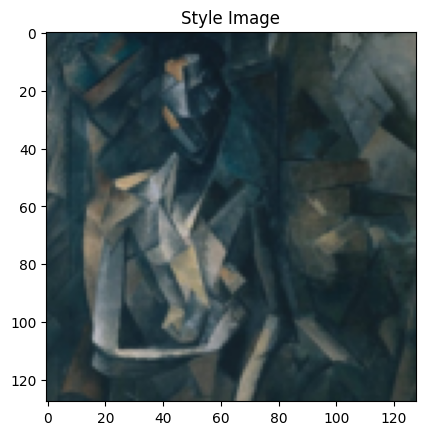

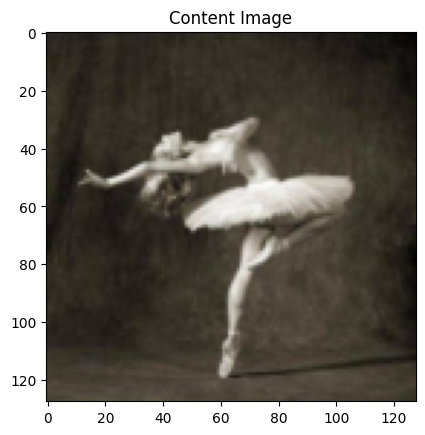

In [42]:

style_img   = image_loader("images/picasso.jpeg")
content_img = image_loader("images/dancing.jpeg")

assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"



plt.ion()


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')


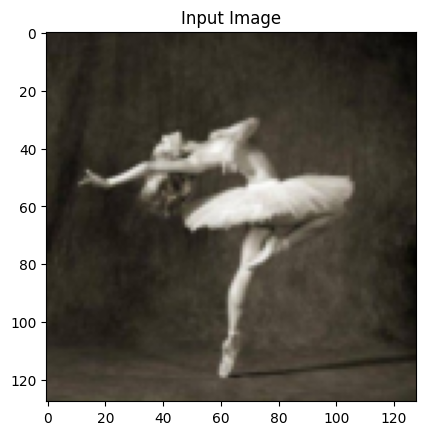

In [43]:

input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')


In [44]:

output = run_style_transfer(
                  cnn, 
                  cnn_normalization_mean, 
                  cnn_normalization_std,
                  content_img, 
                  style_img, 
                  input_img
)



Building the style transfer model..


/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.
/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # This is added back by InteractiveShellApp.init_path()


Optimizing..
run [50]:
Style Loss : 24.817640 Content Loss: 9.843668

run [100]:
Style Loss : 6.973824 Content Loss: 8.730038

run [150]:
Style Loss : 3.722337 Content Loss: 7.978809

run [200]:
Style Loss : 2.731739 Content Loss: 7.471065

run [250]:
Style Loss : 2.246134 Content Loss: 7.149652

run [300]:
Style Loss : 1.972694 Content Loss: 6.937741



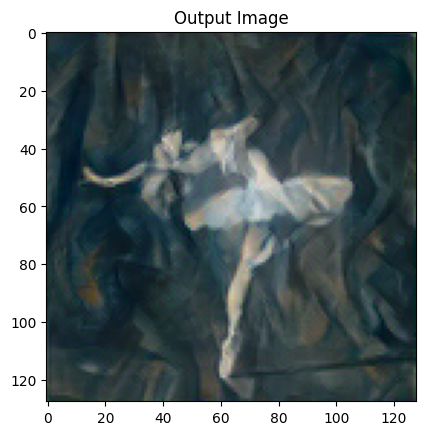

In [45]:

output_name = "outputs/ballerinaPicasso.jpg"

plt.figure()

imshow(output, title='Output Image')

output_pil = to_save_as_PIL(output)
output_pil.save(output_name)


# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()


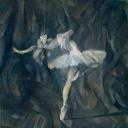

In [46]:

img1 = Image.open(output_name)
img1


## Monet

In [78]:
img1 = Image.open("images/monet1.jpeg")
width, height = img1.size
print(width, height )
newsize = (1152, 768)
img1 = img1.resize(newsize)
width, height = img1.size
print(width, height )
img1.save("images/monet1_resize.jpeg")

695 560
1152 768


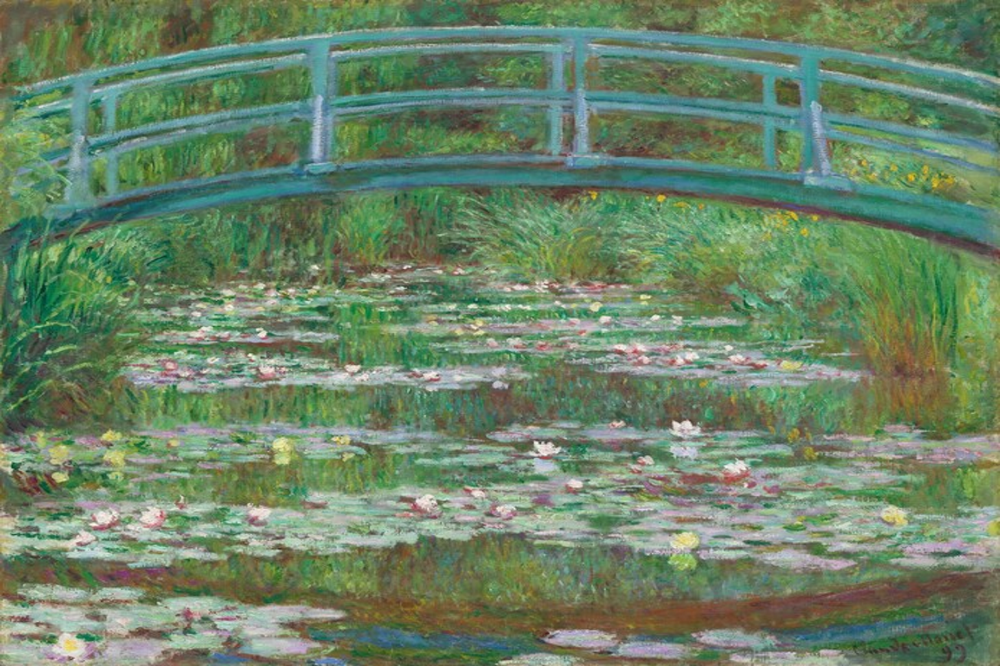

In [79]:
img1

In [80]:
img2 = Image.open("images/PNW_original.jpg")
width, height = img1.size
print(width, height )

1152 768


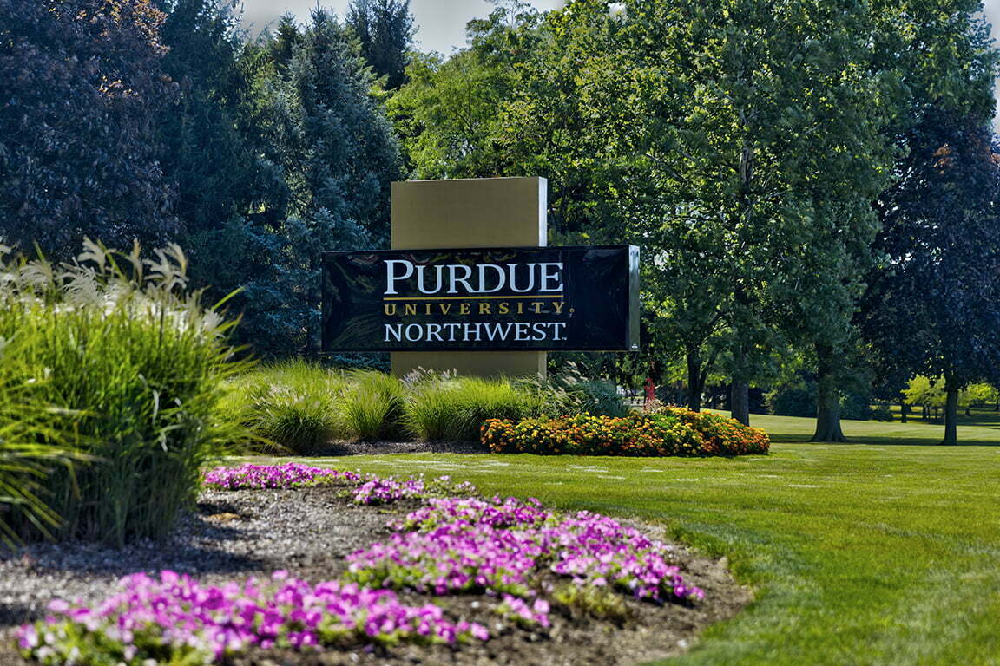

In [81]:
img2

In [82]:

style_img   = image_loader("images/monet1_resize.jpeg")
content_img = image_loader("images/PNW_original.jpg")

print(style_img.size())
print(content_img.size())




torch.Size([1, 3, 128, 192])
torch.Size([1, 3, 128, 192])


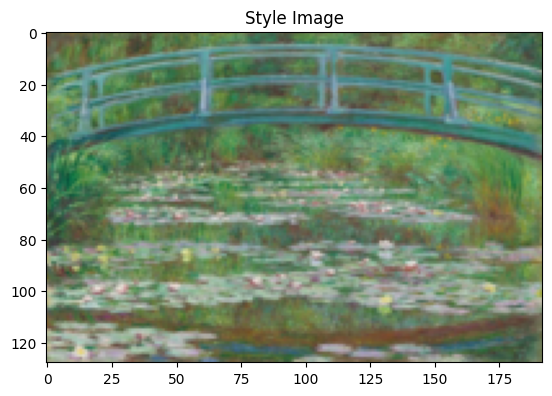

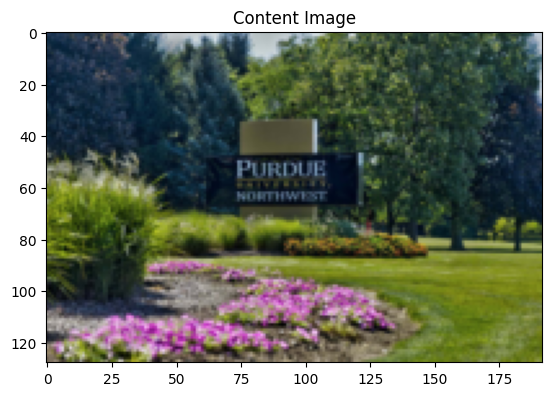

In [83]:
assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"



plt.ion()


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

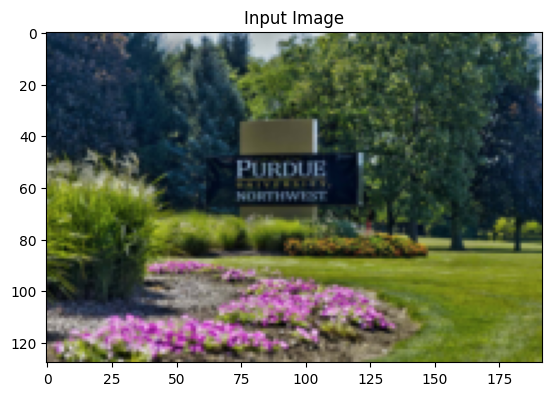

In [84]:

input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')


In [85]:


output = run_style_transfer(
                  cnn, 
                  cnn_normalization_mean, 
                  cnn_normalization_std,
                  content_img, 
                  style_img, 
                  input_img
)


Building the style transfer model..


/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.
/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # This is added back by InteractiveShellApp.init_path()


Optimizing..
run [50]:
Style Loss : 53.995728 Content Loss: 20.720518

run [100]:
Style Loss : 16.124645 Content Loss: 17.411074

run [150]:
Style Loss : 7.033883 Content Loss: 14.787934

run [200]:
Style Loss : 3.919959 Content Loss: 12.872106

run [250]:
Style Loss : 2.710932 Content Loss: 11.707936

run [300]:
Style Loss : 2.174123 Content Loss: 11.014821



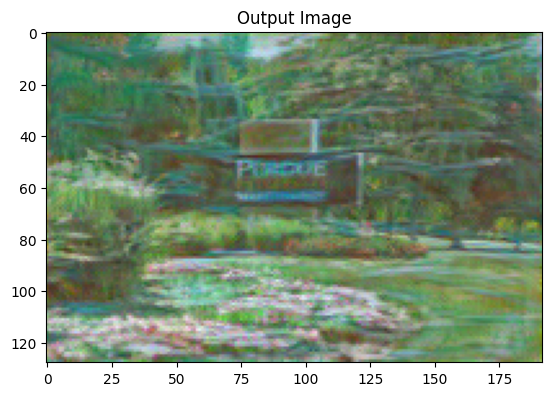

In [86]:

output_name = "outputs/PNW_monet.jpg"

plt.figure()

imshow(output, title='Output Image')

output_pil = to_save_as_PIL(output)
output_pil.save(output_name)


# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()


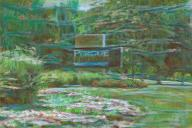

In [87]:

img1 = Image.open(output_name)
img1


## vincent van goh

In [97]:

img1 = Image.open("images/vangoh1.jpeg")
width, height = img1.size
print(width, height )
newsize = (1152, 768)
img1 = img1.resize(newsize)
width, height = img1.size
print(width, height )
img1.save("images/vangoh1_resize.jpeg")


1536 864
1152 768


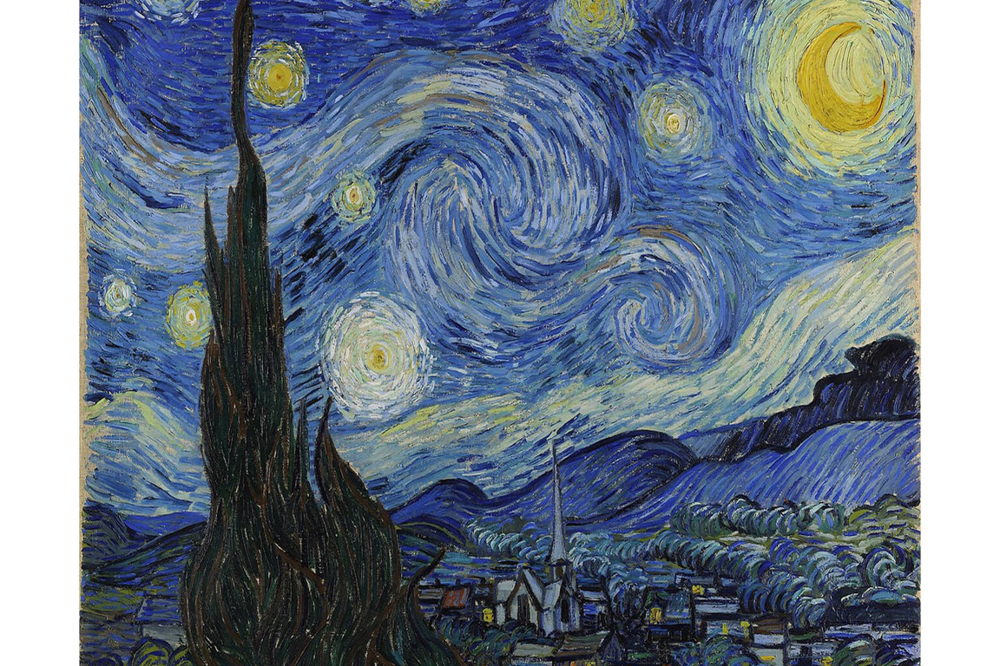

In [98]:
img1

In [99]:

img2 = Image.open("images/PNW_original.jpg")
width, height = img2.size
print(width, height )


1152 768


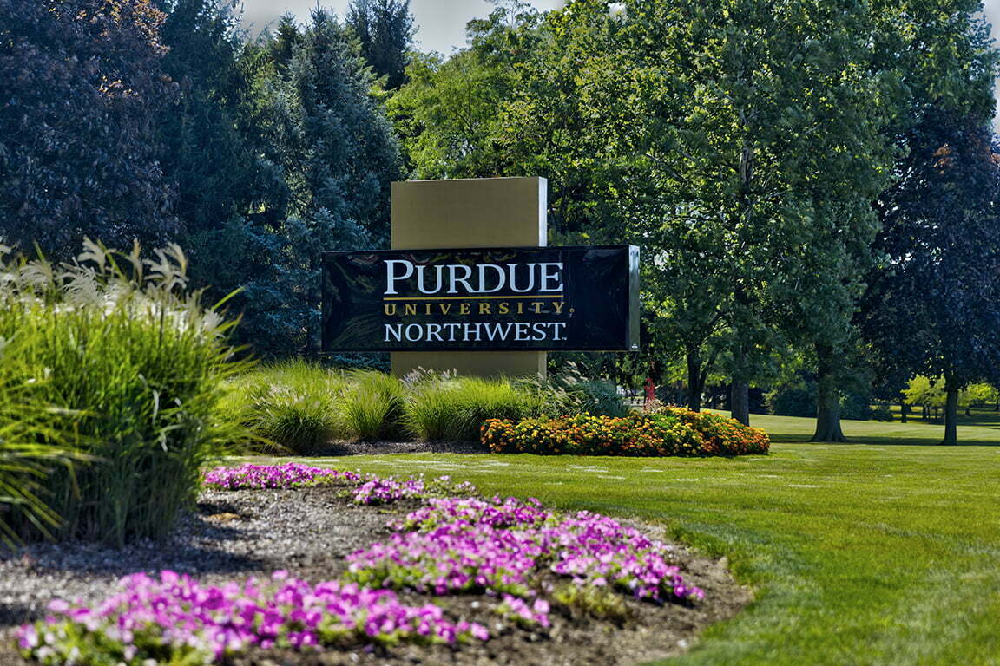

In [100]:
img2

In [103]:

style_img   = image_loader("images/vangoh1_resize.jpeg")
content_img = image_loader("images/PNW_original.jpg")

print(style_img.size())
print(content_img.size())



torch.Size([1, 3, 128, 192])
torch.Size([1, 3, 128, 192])


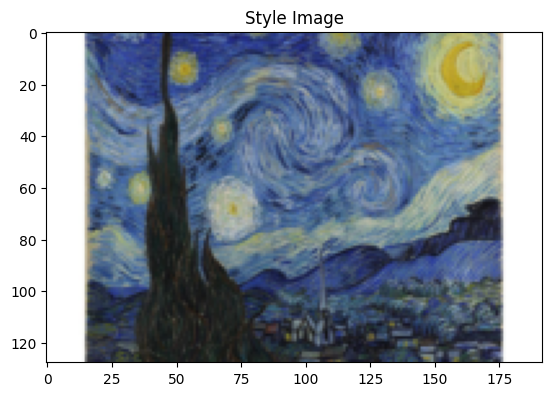

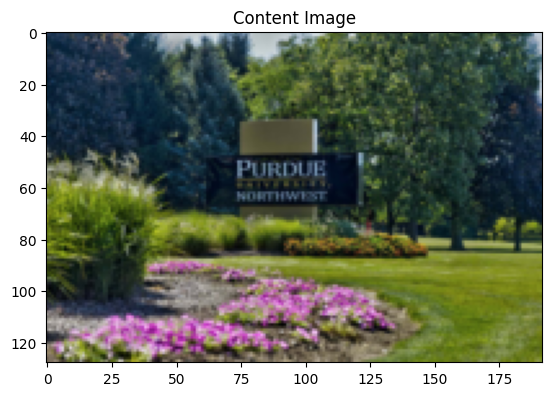

In [104]:
assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"



plt.ion()


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

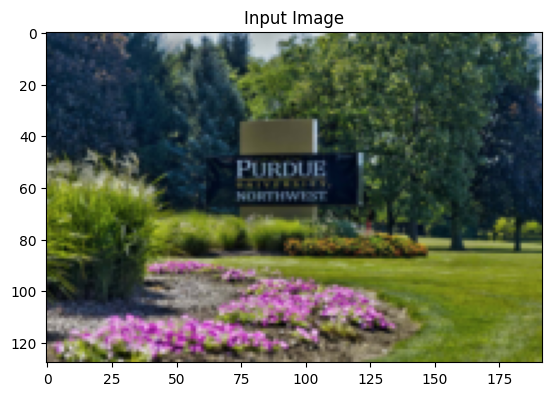

In [105]:

input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

In [109]:
output = run_style_transfer(
                  cnn, 
                  cnn_normalization_mean, 
                  cnn_normalization_std,
                  content_img, 
                  style_img, 
                  input_img
)

Building the style transfer model..


/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.
/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # This is added back by InteractiveShellApp.init_path()


Optimizing..
run [50]:
Style Loss : 23.339664 Content Loss: 20.527220

run [100]:
Style Loss : 20.333067 Content Loss: 19.779596

run [150]:
Style Loss : 18.480795 Content Loss: 19.747316

run [200]:
Style Loss : 16.231920 Content Loss: 20.325491

run [250]:
Style Loss : 14.501979 Content Loss: 21.079826

run [300]:
Style Loss : 12.363576 Content Loss: 20.724871



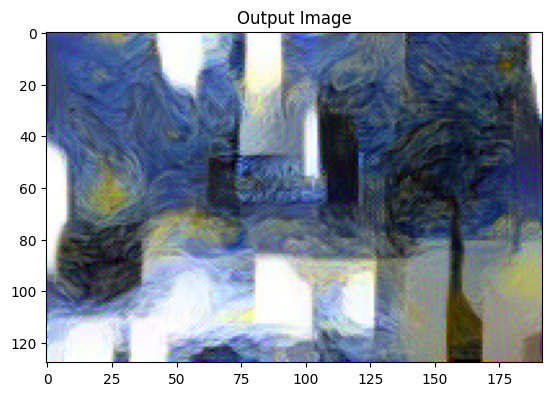

In [110]:

output_name = "outputs/PNW_vangoh.jpg"

plt.figure()

imshow(output, title='Output Image')

output_pil = to_save_as_PIL(output)
output_pil.save(output_name)


# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()


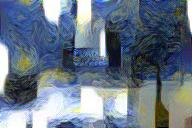

In [111]:


img1 = Image.open(output_name)
img1


## picasso

In [118]:

img1 = Image.open("images/picasso.jpeg")
width, height = img1.size
print(width, height )
newsize = (1152, 768)
img1 = img1.resize(newsize)
width, height = img1.size
print(width, height )
img1.save("images/picasso_resize.jpeg")


650 650
1152 768


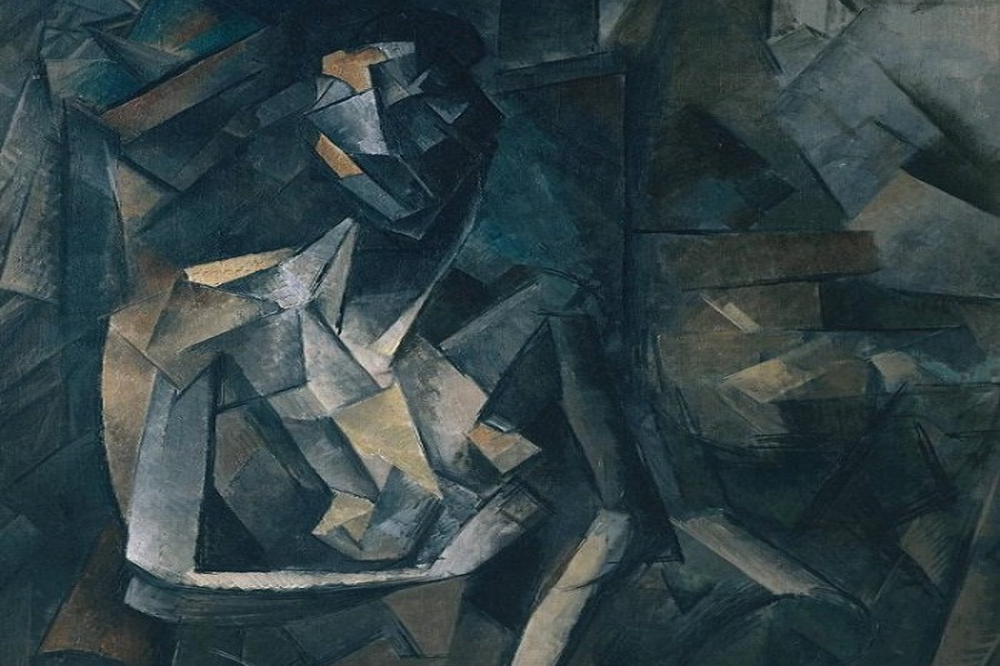

In [119]:
img1

In [120]:

img2 = Image.open("images/PNW_original.jpg")
width, height = img2.size
print(width, height )


1152 768


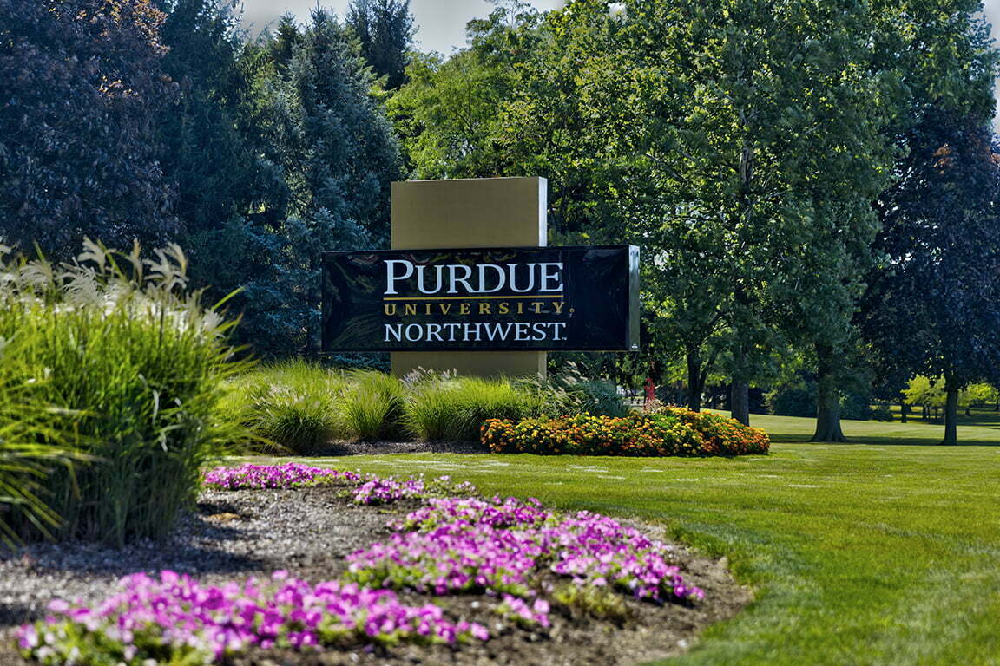

In [121]:
img2

In [123]:
style_img   = image_loader("images/picasso_resize.jpeg")
content_img = image_loader("images/PNW_original.jpg")

print(style_img.size())
print(content_img.size())




torch.Size([1, 3, 128, 192])
torch.Size([1, 3, 128, 192])


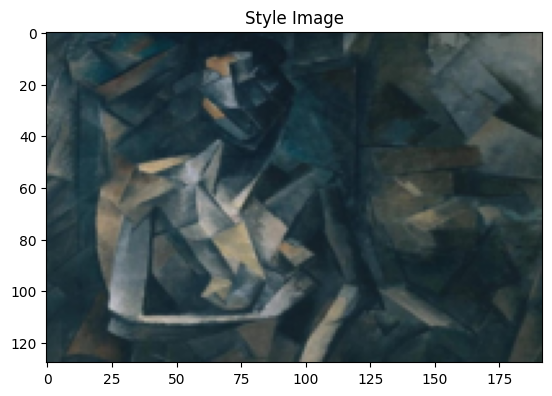

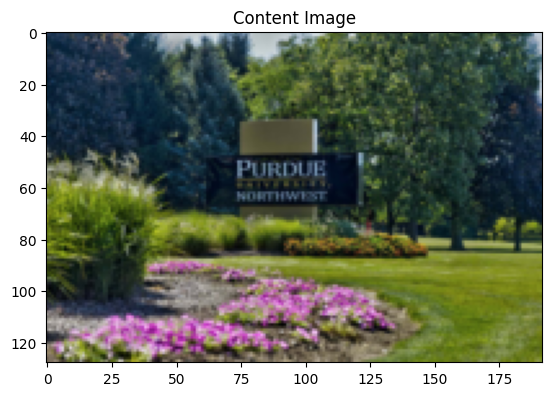

In [124]:
assert style_img.size() == content_img.size(), \
    "we need to import style and content images of the same size"



plt.ion()


plt.figure()
imshow(style_img, title='Style Image')

plt.figure()
imshow(content_img, title='Content Image')

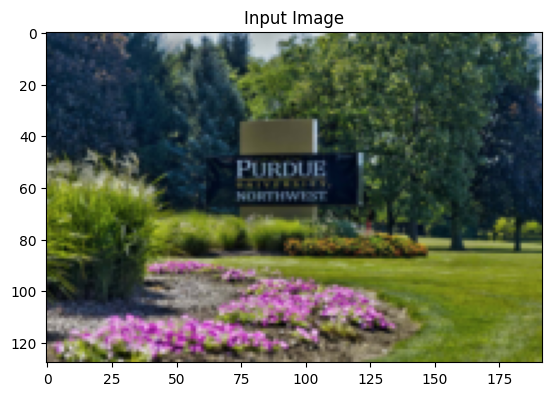

In [125]:

input_img = content_img.clone()
# if you want to use white noise instead uncomment the below line:
# input_img = torch.randn(content_img.data.size(), device=device)

# add the original input image to the figure:
plt.figure()
imshow(input_img, title='Input Image')

In [126]:
output = run_style_transfer(
                  cnn, 
                  cnn_normalization_mean, 
                  cnn_normalization_std,
                  content_img, 
                  style_img, 
                  input_img
)

Building the style transfer model..


/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # Remove the CWD from sys.path while we load stuff.
/Users/user/opt/anaconda3/envs/py37_GANs_Torch/lib/python3.7/site-packages/ipykernel_launcher.py:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  # This is added back by InteractiveShellApp.init_path()


Optimizing..
run [50]:
Style Loss : 30.312178 Content Loss: 19.953989

run [100]:
Style Loss : 9.968328 Content Loss: 17.315382

run [150]:
Style Loss : 6.075478 Content Loss: 15.553066

run [200]:
Style Loss : 4.093529 Content Loss: 14.704304

run [250]:
Style Loss : 3.149100 Content Loss: 14.158531

run [300]:
Style Loss : 2.608212 Content Loss: 13.817550



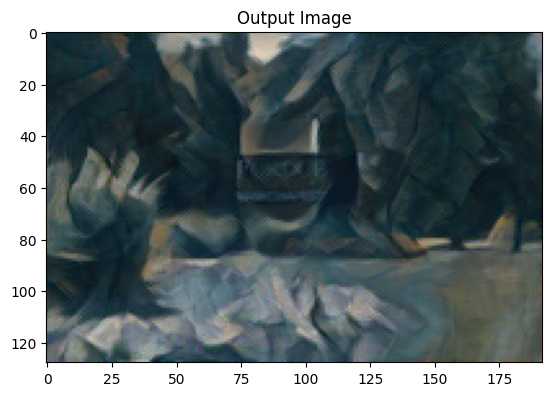

In [127]:
output_name = "outputs/PNW_picasso.jpg"

plt.figure()

imshow(output, title='Output Image')

output_pil = to_save_as_PIL(output)
output_pil.save(output_name)


# sphinx_gallery_thumbnail_number = 4
plt.ioff()
plt.show()

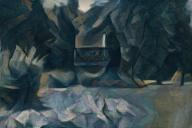

In [128]:

img1 = Image.open(output_name)
img1